# Lab 2 - Exploring Joining strategies

In this lab, we will investigate the joining of the property data from 2004-2015 to the water quality data.  First, we need to 

1. Understand the big picture and determine the key(s) used to join tables.
2. Understand the relationship between tables (one-to-one; one-to-many; many-to-many), and
3. Pick a join type and investigate key mismatches.

## Problem 1 - Understanding the big picture and tables keys

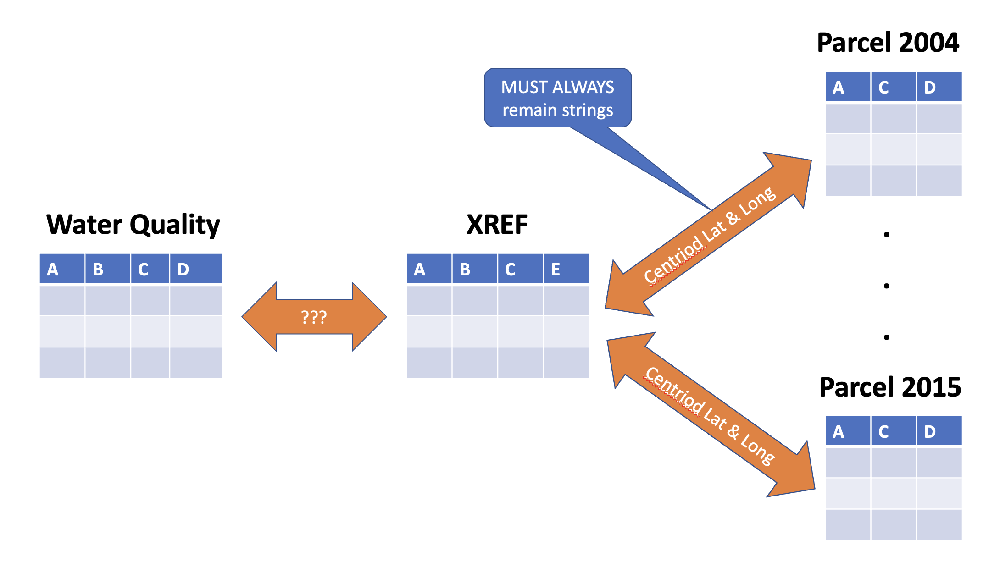

**Task.**  The picture shown above provides a high-level view of the joining process. Remember that our goal is to explain changes in water quality in various lakes over time.  What do you think the structure of the final table should be?  One row per what? Describe some examples of the sort of columns you would want present in this file.

In [5]:
import polars as pl

(
    pl.scan_csv(
        "./data/MinneMUDAC_raw_files/mces_lakes_1999_2014.txt",
        separator="|"
    )
    .select(pl.all().head(0))   # returns schema but only first few cols
    .schema
)


C:\Users\im4284hw\AppData\Local\Temp\ipykernel_15160\1368420470.py:9: PerformanceWarning: Resolving the schema of a LazyFrame is a potentially expensive operation. Use `LazyFrame.collect_schema()` to get the schema without this warning.
  .schema


Schema([("PROJECT_ID\tDATA_SET_TITLE\tLAKE_NAME\tCITY\tCOUNTY\tDNR_ID_Site_Number\tMAJOR_WATERSHED\tWATER_PLANNING_AUTHORITY\tLAKE_SITE_NUMBER\tSTART_DATE\tSTART_HOURMIN24\tEND_DATE\tEND_HOURMIN24\tSAMPLE_DEPTH_IN_METERS\tSeasonal_Lake_Grade_RESULT\tSeasonal_Lake_Grade_QUALIFIER\tSeasonal_Lake_Grade_Units\tPhysical_Condition_RESULT\tPhysical_Condition_QUALIFIER\tPhysical_Condition_Units\tRecreational_Suitability_RESULT\tRecreational_Suitability_QUALIFIER\tRecreational_Suitability_Units\tSecchi_Depth_RESULT_SIGN\tSecchi_Depth_RESULT\tSecchi_Depth_QUALIFIER\tSecchi_Depth_Units\tTotal_Phosphorus_RESULT_SIGN\tTotal_Phosphorus_RESULT\tTotal_Phosphorus_QUALIFIER\tTotal_Phosphorus_Units\tlongitude\tlatitude\r7108\tCitizen Assisted Monitoring Program (CAMP) for Lakes\tAcorn Lake\tOakdale\tWashington\t82010200-01\tLower St. Croix River\tValley Branch WD\t1\t2006-04-16\t0:00\t2006-04-16\t0:00\t0\t\t\t0-4 Categorical Calculated Seasonally: 4 good & 0 bad\t1\tApproved\t1-5 Categorical: 1 good & 5 

In [2]:
(
    pl.scan_csv(
        "./data/MinneMUDAC_raw_files/Parcel_Lake_Monitoring_Site_Xref.txt",
        separator="|"
    )
    .columns
)


C:\Users\im4284hw\AppData\Local\Temp\ipykernel_15160\3236559190.py:6: PerformanceWarning: Determining the column names of a LazyFrame requires resolving its schema, which is a potentially expensive operation. Use `LazyFrame.collect_schema().names()` to get the column names without this warning.
  .columns


['Parcel_PIN\tMonit_MAP_CODE1\tMonit_SITE_CODE\tMonit_LAKE_SITE\tDistance_Parcel_Monitoring_Site_meters\tLake_Hydroid\tDistance_Parcel_Lake_meters\tcentroid_long\tcentroid_lat\tParcel_pkey']

In [3]:
(
    pl.scan_csv(
        "./data/MinneMUDAC_raw_files/2004_metro_tax_parcels.txt",
        separator="|"
    )
    .columns
)


C:\Users\im4284hw\AppData\Local\Temp\ipykernel_15160\12170490.py:6: PerformanceWarning: Determining the column names of a LazyFrame requires resolving its schema, which is a potentially expensive operation. Use `LazyFrame.collect_schema().names()` to get the column names without this warning.
  .columns


['ACRES_DEED',
 'ACRES_POLY',
 'AGPRE_ENRD',
 'AGPRE_EXPD',
 'AG_PRESERV',
 'BASEMENT',
 'BLDG_NUM',
 'BLOCK',
 'CITY',
 'CITY_USPS',
 'COOLING',
 'COUNTY_ID',
 'DWELL_TYPE',
 'EMV_BLDG',
 'EMV_LAND',
 'EMV_TOTAL',
 'FIN_SQ_FT',
 'GARAGE',
 'GARAGESQFT',
 'GREEN_ACRE',
 'HEATING',
 'HOMESTEAD',
 'HOME_STYLE',
 'ID',
 'LANDMARK',
 'LOT',
 'MULTI_USES',
 'NUM_UNITS',
 'OPEN_SPACE',
 'OWNER_MORE',
 'OWNER_NAME',
 'OWN_ADD_L1',
 'OWN_ADD_L2',
 'OWN_ADD_L3',
 'PARC_CODE',
 'PIN',
 'PLAT_NAME',
 'PREFIXTYPE',
 'PREFIX_DIR',
 'SALE_DATE',
 'SALE_VALUE',
 'SCHOOL_DST',
 'SPEC_ASSES',
 'STREETNAME',
 'STREETTYPE',
 'SUFFIX_DIR',
 'Shape_Area',
 'Shape_Leng',
 'TAX_ADD_L1',
 'TAX_ADD_L2',
 'TAX_ADD_L3',
 'TAX_CAPAC',
 'TAX_EXEMPT',
 'TAX_NAME',
 'TOTAL_TAX',
 'UNIT_INFO',
 'USE1_DESC',
 'USE2_DESC',
 'USE3_DESC',
 'USE4_DESC',
 'WSHD_DIST',
 'XUSE1_DESC',
 'XUSE2_DESC',
 'XUSE3_DESC',
 'XUSE4_DESC',
 'YEAR_BUILT',
 'Year',
 'ZIP',
 'ZIP4',
 'centroid_lat',
 'centroid_long']

In [8]:
from glob import glob
import re

parcel_paths = sorted(glob("./data/MinneMUDAC_raw_files/*_metro_tax_parcels.txt"))

[
    (
        re.search(r"\d{4}", path).group(),
        pl.scan_csv(path, separator="|").columns
    )
    for path in parcel_paths
]


C:\Users\im4284hw\AppData\Local\Temp\ipykernel_15160\4188771588.py:9: PerformanceWarning: Determining the column names of a LazyFrame requires resolving its schema, which is a potentially expensive operation. Use `LazyFrame.collect_schema().names()` to get the column names without this warning.
  pl.scan_csv(path, separator="|").columns


[('2002',
  ['ACRES_DEED',
   'ACRES_POLY',
   'AGPRE_ENRD',
   'AGPRE_EXPD',
   'AG_PRESERV',
   'BASEMENT',
   'BLDG_NUM',
   'BLOCK',
   'CITY',
   'CITY_USPS',
   'COOLING',
   'COUNTY_ID',
   'DWELL_TYPE',
   'EMV_BLDG',
   'EMV_LAND',
   'EMV_TOTAL',
   'FIN_SQ_FT',
   'GARAGE',
   'GARAGESQFT',
   'GREEN_ACRE',
   'HEATING',
   'HOMESTEAD',
   'HOME_STYLE',
   'LANDMARK',
   'LOT',
   'MULTI_USES',
   'NUM_UNITS',
   'OPEN_SPACE',
   'OWNER_MORE',
   'OWNER_NAME',
   'OWN_ADD_L1',
   'OWN_ADD_L2',
   'OWN_ADD_L3',
   'OWN_NAME',
   'PARC_CODE',
   'PIN',
   'PIN_1',
   'PLAT_NAME',
   'PREFIXTYPE',
   'PREFIX_DIR',
   'SALE_DATE',
   'SALE_VALUE',
   'SCHOOL_DST',
   'SPEC_ASSES',
   'STREET',
   'STREETNAME',
   'STREETTYPE',
   'STRUC_TYPE',
   'SUFFIX_DIR',
   'Shape_Area',
   'Shape_Leng',
   'TAX_ADD_L1',
   'TAX_ADD_L2',
   'TAX_ADD_L3',
   'TAX_ADD_LI',
   'TAX_CAPAC',
   'TAX_EXEMPT',
   'TAX_NAME',
   'TOTAL_TAX',
   'UNIT_INFO',
   'USE1_DESC',
   'USE2_DESC',
   'USE3

> <font color="orange"> Your thoughts here </font>

The final table should have one row for each lake–year combination. This structure lets us analyze how water quality evolves over time for each lake. The table should include lake identifiers and coordinates (from XREF), yearly water-quality measurements, and parcel-based indicators from the 2004–2015 parcel datasets. Additional join-diagnostic columns can help identify mismatches between lakes, coordinates, and parcels. Together, these variables create a unified dataset for modeling water-quality changes.

## Problem 2 - Understanding the big picture and tables keys

**Tasks.**  Perform each of the following task.  Any task that requires data management should be performed separately in both `polars` and `pandas` using lazy data frames.

1. Use a lazy data frame to inspect the columns and a few rows of data. 
2. Suggest the columns that will be used as keys to join the tables.
3. One set of keys are floating point numbers (which?).  Discuss the potential problems with using floating point numbers as keys.  Suggest possible remedies.
3. To understand the relationship (one-to-one; one-to-many; many-to-many) between tables, select the key columns, perform aggregation on each table to determine if there is one or many keys per row.
4. Based on the results of the last task, suggest a join type and justify your response.

In [1]:
# Place your code/thoughts in one or more code/markdown cells, respectively.

In [ ]:
# You polars code here
import polars as pl

(
    pl.scan_csv(
        "./data/MinneMUDAC_raw_files/mces_lakes_1999_2014.txt",
        separator="|"
    )
    .select(pl.all())
    .head(5)
)


In [ ]:
(
    pl.scan_csv(
        "./data/MinneMUDAC_raw_files/Parcel_Lake_Monitoring_Site_Xref.txt",
        separator="|"
    )
    .select(pl.all())
    .head(5)
)


In [ ]:
(
    pl.scan_csv(
        "./data/MinneMUDAC_raw_files/2004_metro_tax_parcels.txt",
        separator="|"
    )
    .select(pl.all())
    .head(5)
)


In [4]:
%pip install pyspark

     ---------------------------------------- 0.0/434.2 MB ? eta -:--:--
     ---------------------------------------- 1.6/434.2 MB 8.4 MB/s eta 0:00:52
     --------------------------------------- 5.0/434.2 MB 12.6 MB/s eta 0:00:35
      -------------------------------------- 9.4/434.2 MB 15.4 MB/s eta 0:00:28
     - ------------------------------------ 14.7/434.2 MB 17.7 MB/s eta 0:00:24
     - ------------------------------------ 18.4/434.2 MB 18.1 MB/s eta 0:00:23
     - ------------------------------------ 22.3/434.2 MB 18.1 MB/s eta 0:00:23
     -- ----------------------------------- 27.3/434.2 MB 18.8 MB/s eta 0:00:22
     -- ----------------------------------- 32.2/434.2 MB 19.3 MB/s eta 0:00:21
     --- ---------------------------------- 37.7/434.2 MB 20.0 MB/s eta 0:00:20
     --- ---------------------------------- 41.7/434.2 MB 19.8 MB/s eta 0:00:20
     ---- --------------------------------- 46.9/434.2 MB 20.3 MB/s eta 0:00:20
     ---- --------------------------------- 52.

  DEPRECATION: Building 'pyspark' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'pyspark'. Discussion can be found at https://github.com/pypa/pip/issues/6334


In [ ]:
# Your pyspark code here
from pyspark.sql import SparkSession
from pyspark.sql import functions as F

spark = (
    SparkSession
    .builder
    .appName("Lab2")
    .getOrCreate()
)


<h1>Inspect files</h1>
Water Quality file (first few rows + columns)

In [ ]:
wq_spark = (
    spark.read
    .option("header", True)
    .option("delimiter", "|")
    .csv("./data/MinneMUDAC_raw_files/mces_lakes_1999_2014.txt")
)

wq_spark.limit(5)


XREF file

In [ ]:
xref_spark = (
    spark.read
    .option("header", True)
    .option("delimiter", "|")
    .csv("./data/MinneMUDAC_raw_files/Parcel_Lake_Monitoring_Site_Xref.txt")
)

xref_spark.limit(5)


Parcel file

In [ ]:
parcel_spark = (
    spark.read
    .option("header", True)
    .option("delimiter", "|")
    .csv("./data/MinneMUDAC_raw_files/2004_metro_tax_parcels.txt")  #example year is 2004
)

parcel_spark.limit(5)


<h1>FLOATING POINT JOIN PROBLEMS</h1>

In [ ]:
# showing why floats are bad for equality comparisons
spark.sql("SELECT 45.1 = 45.1000000001").show()

In [ ]:
# Convert lat/long to string for safe joining:
parcel_spark_safe = parcel_spark.withColumn(
    "centroid_lat", F.col("centroid_lat").cast("string")
).withColumn(
    "centroid_long", F.col("centroid_long").cast("string")
)


<h1>RELATIONSHIP TESTING (PySpark)</h1>

In [ ]:
# Water Quality key counts
(
    wq_spark
    .groupBy("Monit_SITE_CODE")
    .count()
    .orderBy(F.desc("count"))
)


In [ ]:
# XREF key counts
(
    xref_spark
    .groupBy("Monit_SITE_CODE")
    .count()
    .orderBy(F.desc("count"))
)


In [ ]:
# Parcel key counts (lat/long pairs)
(
    parcel_spark_safe
    .groupBy("centroid_lat", "centroid_long")
    .count()
    .orderBy(F.desc("count"))
)


<h1>SUGGEST JOIN TYPE (PySpark logic) </h1>

In [ ]:
# Water Quality ↔ XREF
# Use inner join (only lakes appearing in both tables)
joined_wq_xref = (
    wq_spark
    .join(
        xref_spark,
        on="Monit_SITE_CODE",
        how="inner"
    )
)


In [ ]:
# XREF ↔ Parcel
# Use left join (keep all lakes even if parcels missing)
xref_parcel_joined = (
    xref_spark
    .join(
        parcel_spark_safe,
        on=["centroid_lat","centroid_long"],
        how="left"
    )
)


## Problem 3 - Make join key indicator tables - Water Quality VS XREF

Now that you have identified the keys for joining the water quality file with the XREF, make an indicator column table as shown below.

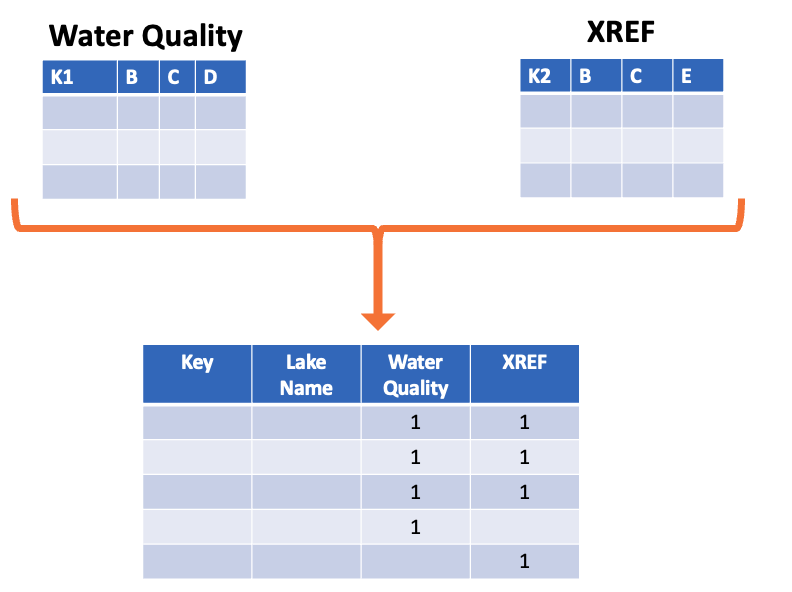

Use this table to explore all mismatches

In [2]:
# Your code here

<h1>Polars version</h1>

In [ ]:
# Load both tables lazily
wq = pl.scan_csv(
    "./data/MinneMUDAC_raw_files/mces_lakes_1999_2014.txt",
    separator="|"
)

xref = pl.scan_csv(
    "./data/MinneMUDAC_raw_files/Parcel_Lake_Monitoring_Site_Xref.txt",
    separator="|"
)


In [2]:
#  Extract unique site codes
wq = pl.scan_csv(
    "./data/MinneMUDAC_raw_files/mces_lakes_1999_2014.txt",
    separator="|"
)

xref = pl.scan_csv(
    "./data/MinneMUDAC_raw_files/Parcel_Lake_Monitoring_Site_Xref.txt",
    separator="|"
)


In [ ]:
# Full outer join to create indicator table
indicator_table = (
    wq_keys
    .join(
        xref_keys,
        on="Monit_SITE_CODE",
        how="outer"
    )
    .fill_null(0)
    .sort("Monit_SITE_CODE")
)

indicator_table


In [ ]:
# Look for mismatches
indicator_table.filter(pl.col("in_wq") == 1 & (pl.col("in_xref") == 0)) #WQ but not in XREF

indicator_table.filter(pl.col("in_xref") == 1 & (pl.col("in_wq") == 0)) #XREF but not in WQ


<h1>Pyspark version</h1>

Load tables

In [ ]:
from pyspark.sql import functions as F

wq_spark = (
    spark.read
    .option("header", True)
    .option("delimiter", "|")
    .csv("./data/MinneMUDAC_raw_files/mces_lakes_1999_2014.txt")
)

xref_spark = (
    spark.read
    .option("header", True)
    .option("delimiter", "|")
    .csv("./data/MinneMUDAC_raw_files/Parcel_Lake_Monitoring_Site_Xref.txt")
)


Extract unique keys with indicators

In [ ]:
wq_keys_spark = (
    wq_spark
    .select("Monit_SITE_CODE")
    .distinct()
    .withColumn("in_wq", F.lit(1))
)

xref_keys_spark = (
    xref_spark
    .select("Monit_SITE_CODE")
    .distinct()
    .withColumn("in_xref", F.lit(1))
)


Full Outer Join

In [ ]:
indicator_table_spark = (
    wq_keys_spark
    .join(
        xref_keys_spark,
        on="Monit_SITE_CODE",
        how="outer"
    )
    .fillna(0)
    .orderBy("Monit_SITE_CODE")
)


Show mismatches

In [ ]:
indicator_table_spark.filter("in_wq = 1 AND in_xref = 0") #WQ but not in XREF
indicator_table_spark.filter("in_xref = 1 AND in_wq = 0")   #XREF but not in WQ

## Problem 4 - Make an indicator column for the lat/long keys XREF VS parcel files.

To explore mismatches based on the lat/long keys, we will make another indicator table as shown below.

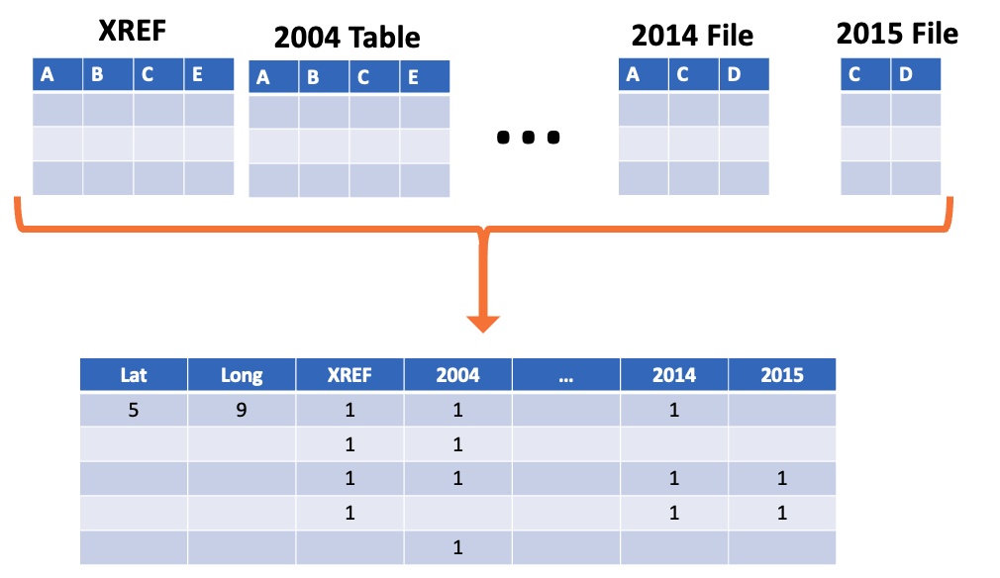

Again, use this table to explore all mismatches.

**Important.** Be sure to read the lat/long columns as strings!

In [ ]:
# Your code here

<h1>Polars version</h1>

Load XREF (cast lat/long as Utf8)

In [ ]:
xref = (
    pl.scan_csv(
        "./data/MinneMUDAC_raw_files/Parcel_Lake_Monitoring_Site_Xref.txt",
        separator="|"
    )
    .with_columns(
        pl.col("centroid_lat").cast(pl.Utf8),
        pl.col("centroid_long").cast(pl.Utf8)
    )
)


Load all parcel files (cast lat/long as strings)

In [ ]:

parcel_paths = sorted(glob("./data/MinneMUDAC_raw_files/*_metro_tax_parcels.txt"))

parcels = pl.concat([
    (
        pl.scan_csv(path, separator="|")
        .with_columns(
            pl.col("centroid_lat").cast(pl.Utf8),
            pl.col("centroid_long").cast(pl.Utf8)
        )
        .select("centroid_lat", "centroid_long")
        .unique()
        .with_columns(pl.lit(1).alias("in_parcels"))
    )
    for path in parcel_paths
])


Extract XREF lat/long pairs

In [ ]:
xref_keys = (
    xref
    .select("centroid_lat", "centroid_long")
    .unique()
    .with_columns(pl.lit(1).alias("in_xref"))
)


Full Outer Join (Indicator Table)

In [ ]:
latlong_indicator = (
    xref_keys
    .join(
        parcels,
        on=["centroid_lat", "centroid_long"],
        how="outer"
    )
    .fill_null(0)
    .sort(["centroid_lat", "centroid_long"])
)

latlong_indicator


Find mismatches

In [ ]:
# In XREF but not in parcels
latlong_indicator.filter(
    (pl.col("in_xref") == 1) & (pl.col("in_parcels") == 0)
)

# In parcels but not in XREF
latlong_indicator.filter(
    (pl.col("in_parcels") == 1) & (pl.col("in_xref") == 0)
)


<h1>Pyspark version</h1>

Load XREF (lat/long as string)

In [ ]:
xref_spark = (
    spark.read
    .option("header", True)
    .option("delimiter", "|")
    .csv("./data/MinneMUDAC_raw_files/Parcel_Lake_Monitoring_Site_Xref.txt")
    .withColumn("centroid_lat", F.col("centroid_lat").cast("string"))
    .withColumn("centroid_long", F.col("centroid_long").cast("string"))
)


Load all parcel files (lat/long as string)

In [ ]:
# Grab all parcel file paths
parcel_paths = sorted(glob("./data/MinneMUDAC_raw_files/*_metro_tax_parcels.txt"))

# Create a single Spark DF
parcel_spark = None
for p in parcel_paths:
    df = (
        spark.read
        .option("header", True)
        .option("delimiter", "|")
        .csv(p)
        .withColumn("centroid_lat", F.col("centroid_lat").cast("string"))
        .withColumn("centroid_long", F.col("centroid_long").cast("string"))
        .select("centroid_lat", "centroid_long")
        .distinct()
        .withColumn("in_parcels", F.lit(1))
    )
    parcel_spark = df if parcel_spark is None else parcel_spark.union(df)


Extract XREF keys

In [ ]:
xref_keys_spark = (
    xref_spark
    .select("centroid_lat", "centroid_long")
    .distinct()
    .withColumn("in_xref", F.lit(1))
)


Full Outer Join

In [ ]:
latlong_indicator_spark = (
    xref_keys_spark
    .join(
        parcel_spark,
        on=["centroid_lat", "centroid_long"],
        how="outer"
    )
    .fillna(0)
    .orderBy("centroid_lat", "centroid_long")
)


Mismatch detection

In [ ]:
latlong_indicator_spark.filter("in_xref = 1 AND in_parcels = 0")  # In XREF but not in parcels
latlong_indicator_spark.filter("in_parcels = 1 AND in_xref = 0")  #` In parcels but not in XREF`